In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('train.csv')

In [3]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000


we see that in this dataset there are 1168 rows and 81 columns are presents.

firstly we see the null values are presents or not.

In [7]:
df.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      214
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

we see that there are very high numbers of null values so we drop that columns.

In [9]:
df=df.drop(['MiscFeature','Fence','PoolQC','FireplaceQu','Alley'],axis=1)

In [10]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,IR1,Lvl,AllPub,Inside,...,0,0,224,0,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,IR1,Lvl,AllPub,CulDSac,...,0,0,0,0,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,IR1,Lvl,AllPub,FR2,...,0,0,0,0,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,Reg,Lvl,AllPub,FR2,...,0,0,0,0,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Reg,Lvl,AllPub,Inside,...,172,0,0,0,0,7,2008,WD,Normal,40000


In [12]:
df=df.dropna(how='all',axis=1)

In [13]:
df.shape

(1168, 76)

In [14]:
df=df.dropna(thresh=10)

In [15]:
df.shape

(1168, 76)

In [16]:
df=df.fillna(method='pad')


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1168 entries, 0 to 1167
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    1167 non-null   float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   LotShape       1168 non-null   object 
 7   LandContour    1168 non-null   object 
 8   Utilities      1168 non-null   object 
 9   LotConfig      1168 non-null   object 
 10  LandSlope      1168 non-null   object 
 11  Neighborhood   1168 non-null   object 
 12  Condition1     1168 non-null   object 
 13  Condition2     1168 non-null   object 
 14  BldgType       1168 non-null   object 
 15  HouseStyle     1168 non-null   object 
 16  OverallQual    1168 non-null   int64  
 17  OverallCond    1168 non-null   int64  
 18  YearBuil

In [18]:
df=df.dropna()

In [19]:
df.shape

(1167, 76)

In [20]:
df.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 76, dtype: int64

we see that all the data are present.

20     428
60     244
50     113
120     68
70      53
30      52
160     47
80      43
90      41
190     26
85      19
75      14
45      10
180      6
40       3
Name: MSSubClass, dtype: int64


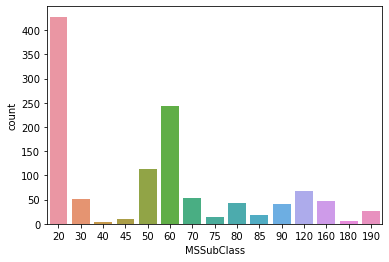

In [21]:
sns.countplot(x='MSSubClass', data=df)
print(df["MSSubClass"].value_counts())

RL         927
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


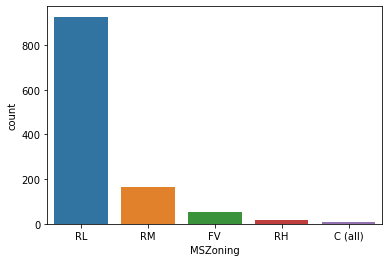

In [22]:
sns.countplot(x='MSZoning', data=df)
print(df["MSZoning"].value_counts())

60.0     132
80.0      74
70.0      70
75.0      57
50.0      51
        ... 
168.0      1
46.0       1
182.0      1
112.0      1
153.0      1
Name: LotFrontage, Length: 106, dtype: int64


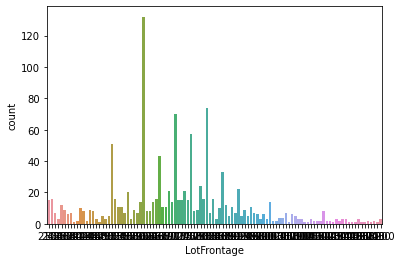

In [23]:
sns.countplot(x='LotFrontage', data=df)
print(df["LotFrontage"].value_counts())

9600     21
7200     18
6000     16
8400     14
10800    11
         ..
10994     1
12803     1
9480      1
13478     1
7861      1
Name: LotArea, Length: 892, dtype: int64


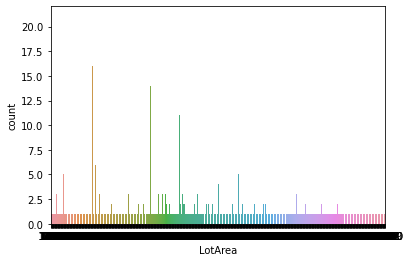

In [24]:
sns.countplot(x='LotArea', data=df)
print(df["LotArea"].value_counts())

Pave    1163
Grvl       4
Name: Street, dtype: int64


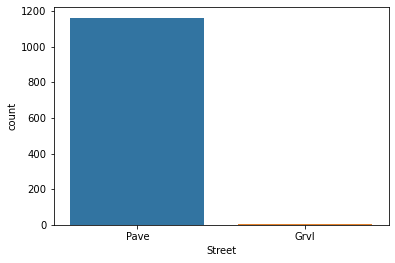

In [25]:
sns.countplot(x='Street', data=df)
print(df["Street"].value_counts())

Reg    740
IR1    389
IR2     32
IR3      6
Name: LotShape, dtype: int64


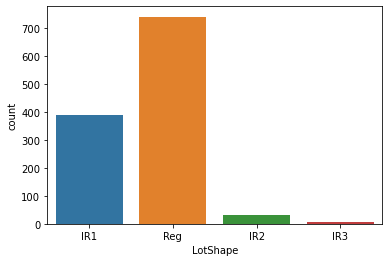

In [26]:
sns.countplot(x='LotShape', data=df)
print(df["LotShape"].value_counts())

Inside     841
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64


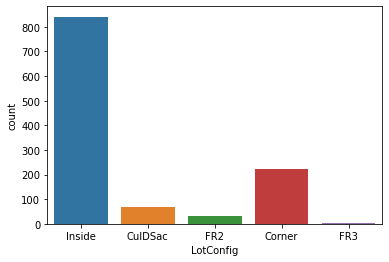

In [27]:
sns.countplot(x='LotConfig', data=df)
print(df["LotConfig"].value_counts())

NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
Timber      24
ClearCr     24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
Veenker      9
MeadowV      9
NPkVill      7
Blueste      2
Name: Neighborhood, dtype: int64


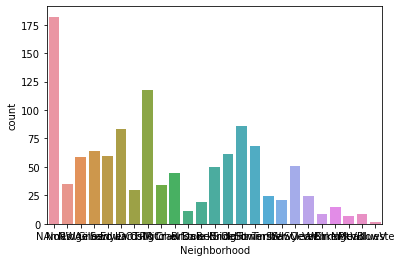

In [28]:
sns.countplot(x='Neighborhood', data=df)
print(df["Neighborhood"].value_counts())

2    609
1    524
3     27
0      7
Name: FullBath, dtype: int64


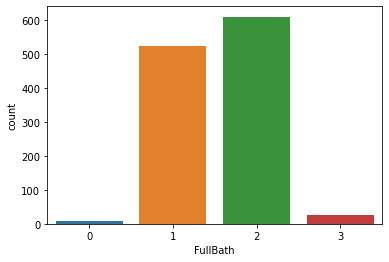

In [29]:
sns.countplot(x='FullBath', data=df)
print(df["FullBath"].value_counts())

GasA     1142
GasW       14
Grav        5
Wall        4
Floor       1
OthW        1
Name: Heating, dtype: int64


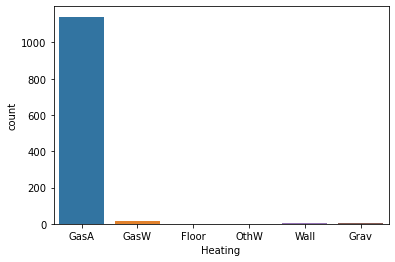

In [30]:
sns.countplot(x='Heating', data=df)
print(df["Heating"].value_counts())

CBlock    515
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64


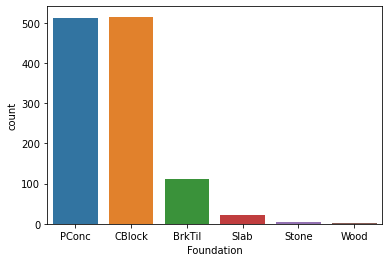

In [31]:
sns.countplot(x='Foundation', data=df)
print(df["Foundation"].value_counts())

CompShg    1143
Tar&Grv      10
WdShngl       6
WdShake       4
Roll          1
ClyTile       1
Metal         1
Membran       1
Name: RoofMatl, dtype: int64


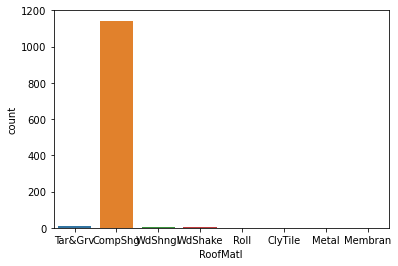

In [33]:
sns.countplot(x='RoofMatl', data=df)
print(df["RoofMatl"].value_counts())

864     19
1040    13
912     12
894     10
848      9
        ..
1039     1
875      1
1600     1
703      1
807      1
Name: 1stFlrSF, Length: 669, dtype: int64


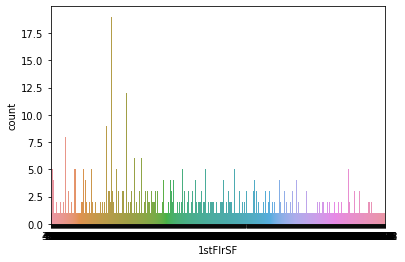

In [34]:
sns.countplot(x='1stFlrSF', data=df)
print(df["1stFlrSF"].value_counts())

SBrkr    1069
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64


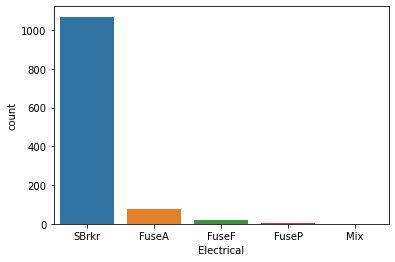

In [35]:
sns.countplot(x='Electrical', data=df)
print(df["Electrical"].value_counts())

0      1144
80        3
360       2
384       1
420       1
473       1
371       1
232       1
513       1
481       1
515       1
514       1
120       1
528       1
572       1
144       1
234       1
390       1
156       1
53        1
392       1
Name: LowQualFinSF, dtype: int64


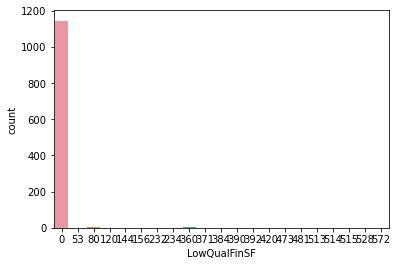

In [37]:
sns.countplot(x='LowQualFinSF', data=df)
print(df["LowQualFinSF"].value_counts())

864     16
1040    11
894     10
1456     9
1200     8
        ..
2296     1
1610     1
2576     1
2810     1
1509     1
Name: GrLivArea, Length: 746, dtype: int64


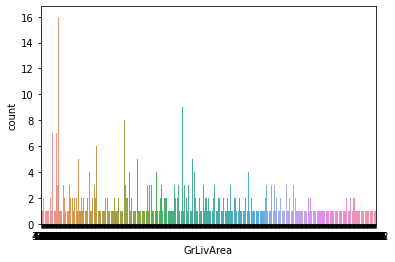

In [38]:
sns.countplot(x='GrLivArea', data=df)
print(df["GrLivArea"].value_counts())

0    685
1    468
2     13
3      1
Name: BsmtFullBath, dtype: int64


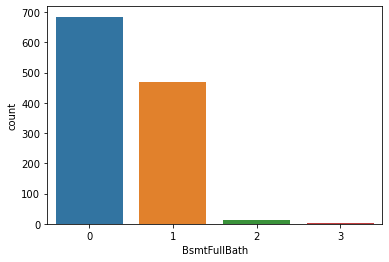

In [39]:
sns.countplot(x='BsmtFullBath', data=df)
print(df["BsmtFullBath"].value_counts())

0    1104
1      61
2       2
Name: BsmtHalfBath, dtype: int64


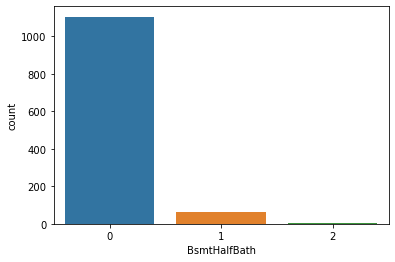

In [40]:
sns.countplot(x='BsmtHalfBath', data=df)
print(df["BsmtHalfBath"].value_counts())

1    1113
2      52
3       1
0       1
Name: KitchenAbvGr, dtype: int64


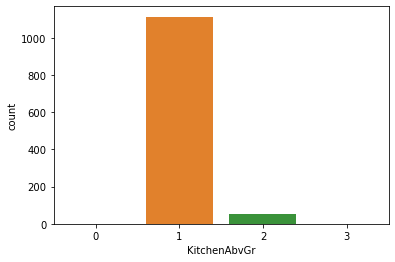

In [41]:
sns.countplot(x='KitchenAbvGr', data=df)
print(df["KitchenAbvGr"].value_counts())

TA    577
Gd    478
Ex     82
Fa     30
Name: KitchenQual, dtype: int64


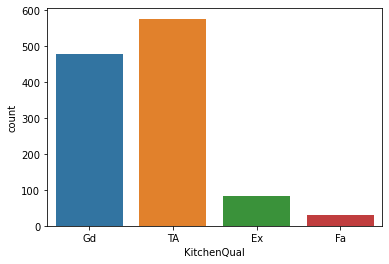

In [42]:
sns.countplot(x='KitchenQual', data=df)
print(df["KitchenQual"].value_counts())

6     325
7     268
5     216
8     148
4      72
9      65
10     41
11     13
3      11
12      6
2       1
14      1
Name: TotRmsAbvGrd, dtype: int64


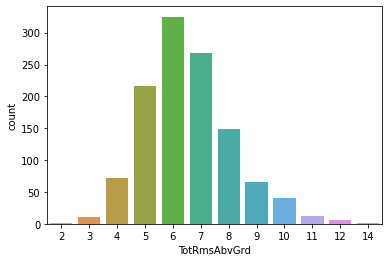

In [43]:
sns.countplot(x='TotRmsAbvGrd', data=df)
print(df["TotRmsAbvGrd"].value_counts())

Typ     1084
Min2      30
Min1      25
Mod       12
Maj1      11
Maj2       4
Sev        1
Name: Functional, dtype: int64


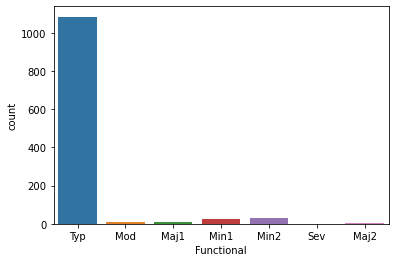

In [44]:
sns.countplot(x='Functional', data=df)
print(df["Functional"].value_counts())

0    551
1    517
2     94
3      5
Name: Fireplaces, dtype: int64


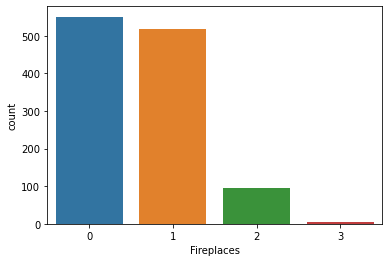

In [45]:
sns.countplot(x='Fireplaces', data=df)
print(df["Fireplaces"].value_counts())

Attchd     729
Detchd     333
BuiltIn     74
Basment     17
CarPort      9
2Types       5
Name: GarageType, dtype: int64


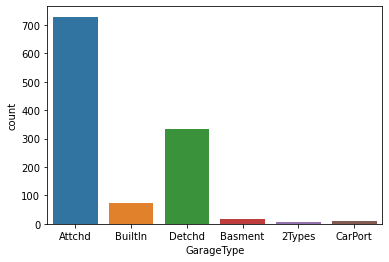

In [47]:
sns.countplot(x='GarageType', data=df)
print(df["GarageType"].value_counts())

6     325
7     268
5     216
8     148
4      72
9      65
10     41
11     13
3      11
12      6
2       1
14      1
Name: TotRmsAbvGrd, dtype: int64
Attchd     729
Detchd     333
BuiltIn     74
Basment     17
CarPort      9
2Types       5
Name: GarageType, dtype: int64


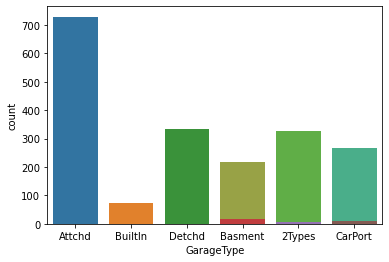

In [46]:
sns.countplot(x='TotRmsAbvGrd', data=df)
print(df["TotRmsAbvGrd"].value_counts())
sns.countplot(x='GarageType', data=df)
print(df["GarageType"].value_counts())

0      531
36      24
48      18
20      17
24      14
      ... 
406      1
176      1
137      1
135      1
15       1
Name: OpenPorchSF, Length: 175, dtype: int64


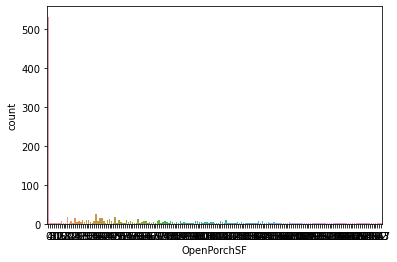

In [49]:
sns.countplot(x='OpenPorchSF', data=df)
print(df["OpenPorchSF"].value_counts())


2007    263
2009    260
2006    254
2008    248
2010    142
Name: YrSold, dtype: int64


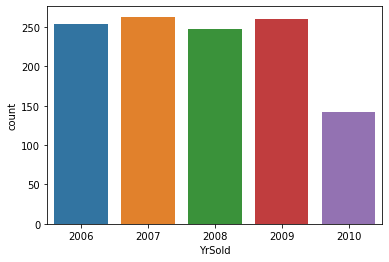

In [50]:
sns.countplot(x='YrSold', data=df)
print(df["YrSold"].value_counts())

0      1160
555       1
576       1
738       1
519       1
480       1
648       1
512       1
Name: PoolArea, dtype: int64


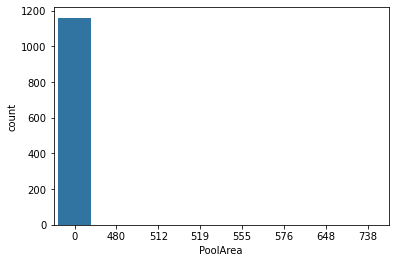

In [51]:
sns.countplot(x='PoolArea', data=df)
print(df["PoolArea"].value_counts())

WD       998
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
Oth        3
CWD        3
Con        2
Name: SaleType, dtype: int64


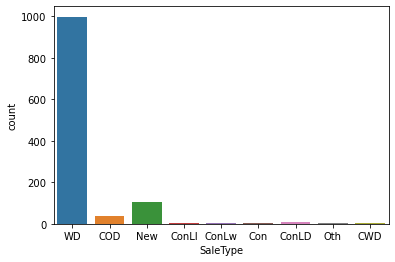

In [52]:
sns.countplot(x='SaleType', data=df)
print(df["SaleType"].value_counts())

Normal     944
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64


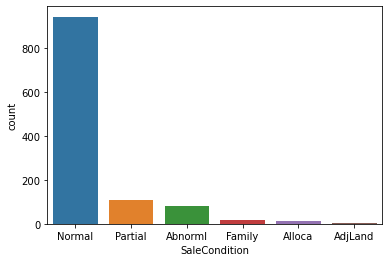

In [53]:
sns.countplot(x='SaleCondition', data=df)
print(df["SaleCondition"].value_counts())

<AxesSubplot:xlabel='SalePrice', ylabel='SaleCondition'>

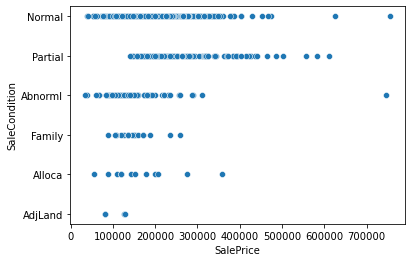

In [54]:
sns.scatterplot('SalePrice','SaleCondition',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='SaleType'>

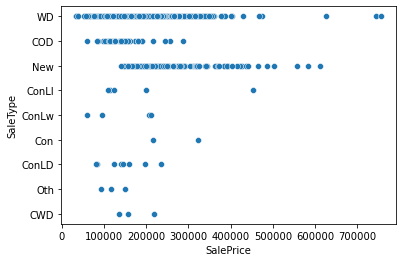

In [55]:
sns.scatterplot('SalePrice','SaleType',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='YrSold'>

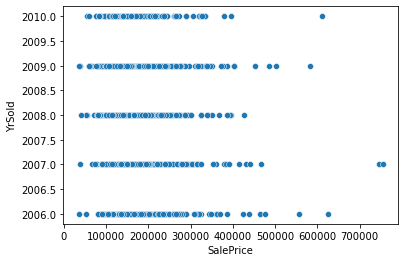

In [56]:
sns.scatterplot('SalePrice','YrSold',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='MoSold'>

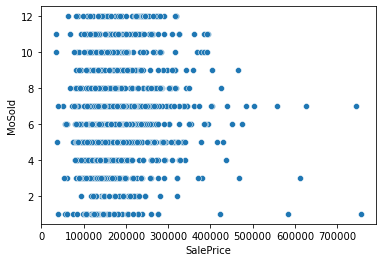

In [57]:
sns.scatterplot('SalePrice','MoSold',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='ScreenPorch'>

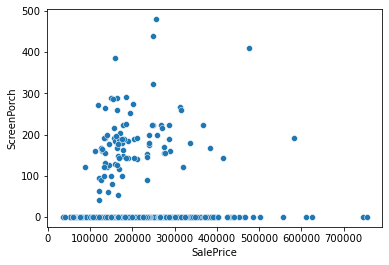

In [58]:
sns.scatterplot('SalePrice','ScreenPorch',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='3SsnPorch'>

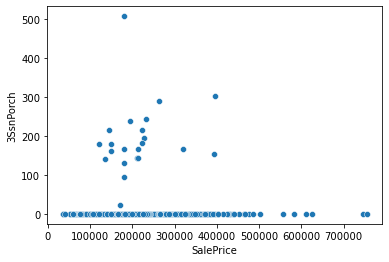

In [59]:
sns.scatterplot('SalePrice','3SsnPorch',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='GarageCond'>

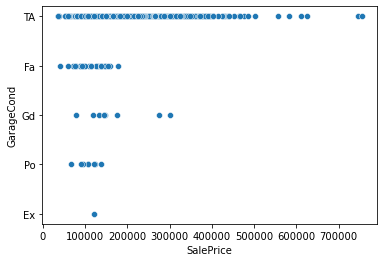

In [60]:
sns.scatterplot('SalePrice','GarageCond',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='GarageArea'>

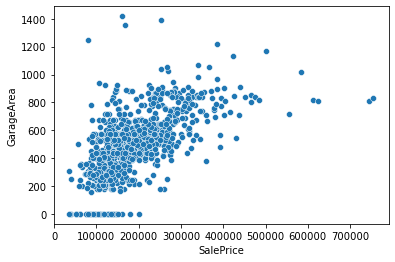

In [61]:
sns.scatterplot('SalePrice','GarageArea',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='GarageYrBlt'>

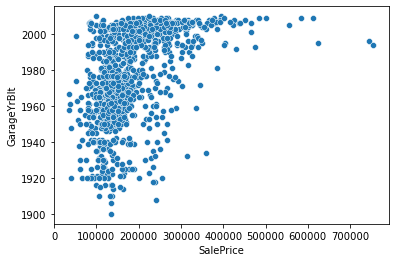

In [62]:
sns.scatterplot('SalePrice','GarageYrBlt',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='Functional'>

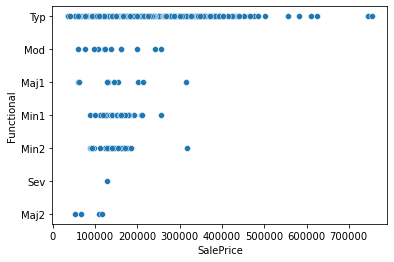

In [63]:
sns.scatterplot('SalePrice','Functional',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='KitchenQual'>

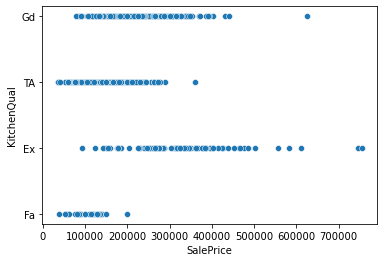

In [64]:
sns.scatterplot('SalePrice','KitchenQual',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='HalfBath'>

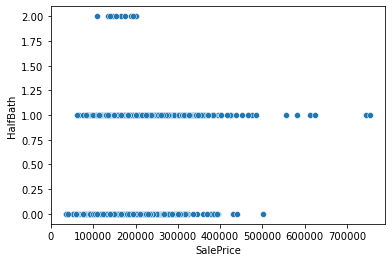

In [65]:
sns.scatterplot('SalePrice','HalfBath',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='BsmtHalfBath'>

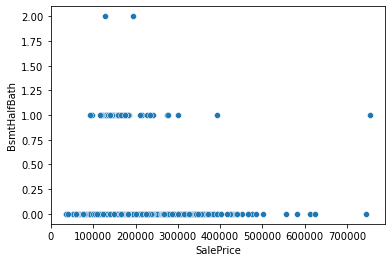

In [66]:
sns.scatterplot('SalePrice','BsmtHalfBath',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='LowQualFinSF'>

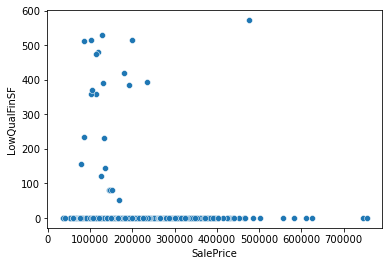

In [67]:
sns.scatterplot('SalePrice','LowQualFinSF',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='2ndFlrSF'>

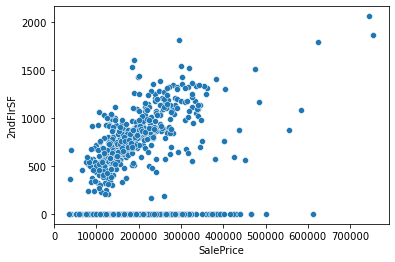

In [68]:
sns.scatterplot('SalePrice','2ndFlrSF',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='1stFlrSF'>

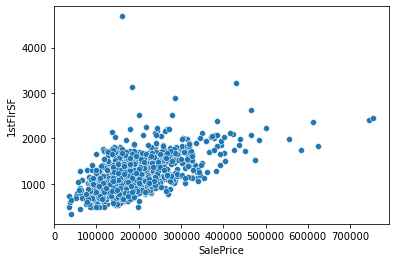

In [69]:
sns.scatterplot('SalePrice','1stFlrSF',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='HeatingQC'>

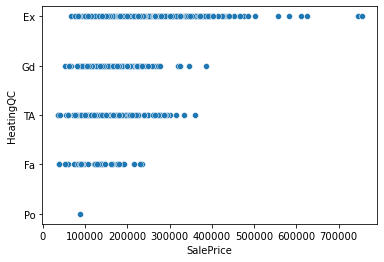

In [70]:
sns.scatterplot('SalePrice','HeatingQC',data=df)

<AxesSubplot:xlabel='SalePrice', ylabel='Heating'>

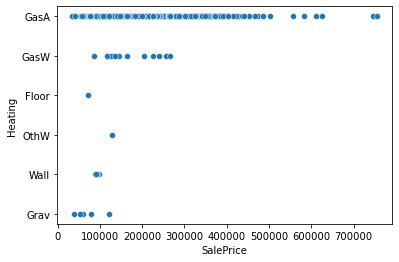

In [71]:
sns.scatterplot('SalePrice','Heating',data=df)

array([[<AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>],
       [<AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>],
       [<AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>],
       [<AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>],
       [<AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>],
       [<AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>],
       [<AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>],
       [<AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel

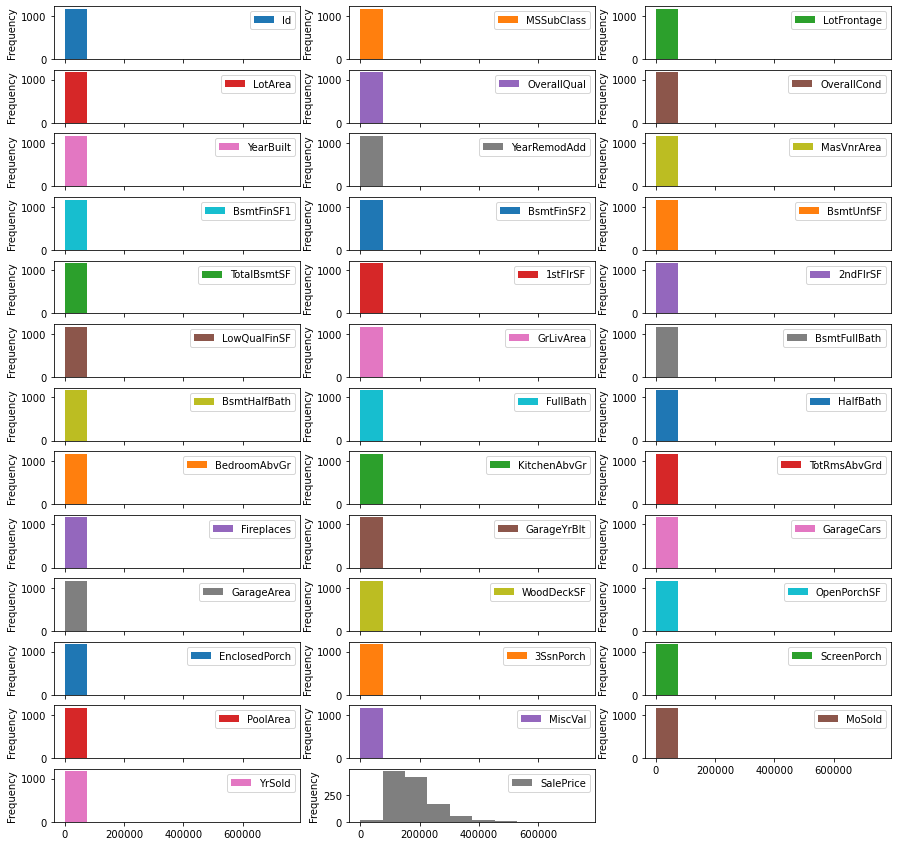

In [75]:
df.plot(kind='hist',subplots=True,layout=(13,3),figsize=(15,15))

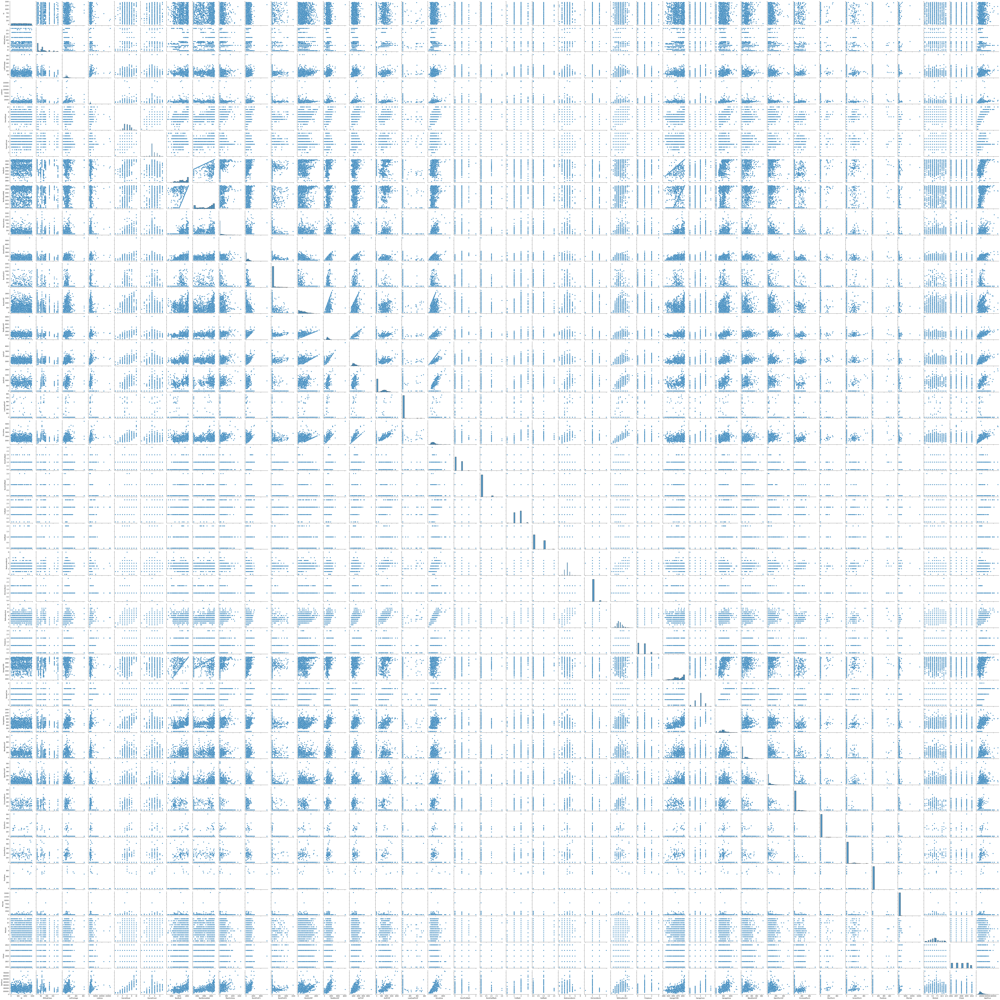

In [77]:
sns.pairplot(df)

so we further do the numaric data so we convert the string data to num form.

In [78]:
from sklearn.preprocessing import LabelEncoder

In [79]:
df1=df.select_dtypes(object)

In [80]:
df1

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
1,RL,Pave,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,...,SBrkr,Gd,Typ,Attchd,Unf,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,...,SBrkr,TA,Typ,Attchd,Unf,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,...,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,COD,Normal
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,...,SBrkr,Gd,Typ,Attchd,Fin,TA,TA,Y,WD,Normal
5,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,...,SBrkr,Gd,Typ,BuiltIn,Fin,TA,TA,Y,New,Partial
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,...,SBrkr,TA,Typ,Detchd,Unf,TA,TA,Y,WD,Normal
1164,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Feedr,Norm,...,SBrkr,Gd,Typ,Detchd,Fin,TA,TA,N,WD,Normal
1165,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,NPkVill,Norm,Norm,...,SBrkr,TA,Typ,Attchd,Unf,TA,TA,Y,WD,Normal
1166,C (all),Pave,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Feedr,Norm,...,SBrkr,TA,Typ,Detchd,Unf,TA,Fa,N,WD,Normal


In [81]:
for i in df1:
    le=LabelEncoder()
    df1[i]= le.fit_transform(df1[i])
df1

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
1,3,1,0,3,0,4,1,12,2,2,...,4,2,6,1,2,4,4,2,8,4
2,3,1,0,3,0,1,0,15,2,2,...,4,3,6,1,2,4,4,2,8,4
3,3,1,0,3,0,4,0,14,2,2,...,4,3,6,1,1,4,4,2,0,4
4,3,1,0,3,0,2,0,14,2,2,...,4,2,6,1,0,4,4,2,8,4
5,3,1,0,3,0,4,0,8,2,2,...,4,2,6,3,0,4,4,2,6,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,3,1,0,3,0,4,0,19,2,2,...,4,3,6,5,2,4,4,2,8,4
1164,3,1,3,3,0,4,0,7,1,2,...,4,2,6,5,0,4,4,0,8,4
1165,3,1,3,3,0,2,0,13,2,2,...,4,3,6,1,2,4,4,2,8,4
1166,0,1,3,3,0,4,0,9,1,2,...,4,3,6,5,2,4,1,0,8,4


In [82]:
df2=df.select_dtypes(float)
df2

,LotFrontage,MasVnrArea,GarageYrBlt
1,95.0,0.0,1970.0
2,92.0,0.0,1997.0
3,105.0,480.0,1977.0
4,105.0,126.0,1977.0
5,58.0,0.0,2006.0
...,...,...,...
1163,45.0,31.0,1970.0
1164,67.0,0.0,2002.0
1165,24.0,0.0,1976.0
1166,50.0,0.0,1920.0


In [83]:
df3=df.select_dtypes(int)
df3

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
1,889,20,15865,8,6,1970,1970,351,823,1043,...,81,207,0,0,224,0,0,10,2007,268000
2,793,60,9920,7,5,1996,1997,862,0,255,...,180,130,0,0,0,0,0,6,2007,269790
3,110,20,11751,6,6,1977,1977,705,0,1139,...,0,122,0,0,0,0,0,1,2010,190000
4,422,20,16635,6,7,1977,2000,1246,0,356,...,240,0,0,0,0,0,0,6,2009,215000
5,1197,60,14054,7,5,2006,2006,0,0,879,...,100,17,0,0,0,0,0,11,2006,219210
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,9819,5,5,1967,1967,450,0,432,...,0,0,0,0,0,0,0,2,2010,122000
1164,554,20,8777,4,5,1949,2003,0,0,0,...,0,96,0,0,0,0,0,5,2009,108000
1165,196,160,2280,6,6,1976,1976,566,0,289,...,87,0,0,0,0,0,0,7,2009,148500
1166,31,70,8500,4,4,1920,1950,0,0,649,...,0,54,172,0,0,0,0,7,2008,40000


In [84]:
df=pd.concat([df1, df2,df3], axis=1)

In [85]:
df

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
1,3,1,0,3,0,4,1,12,2,2,...,81,207,0,0,224,0,0,10,2007,268000
2,3,1,0,3,0,1,0,15,2,2,...,180,130,0,0,0,0,0,6,2007,269790
3,3,1,0,3,0,4,0,14,2,2,...,0,122,0,0,0,0,0,1,2010,190000
4,3,1,0,3,0,2,0,14,2,2,...,240,0,0,0,0,0,0,6,2009,215000
5,3,1,0,3,0,4,0,8,2,2,...,100,17,0,0,0,0,0,11,2006,219210
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,3,1,0,3,0,4,0,19,2,2,...,0,0,0,0,0,0,0,2,2010,122000
1164,3,1,3,3,0,4,0,7,1,2,...,0,96,0,0,0,0,0,5,2009,108000
1165,3,1,3,3,0,2,0,13,2,2,...,87,0,0,0,0,0,0,7,2009,148500
1166,0,1,3,3,0,4,0,9,1,2,...,0,54,172,0,0,0,0,7,2008,40000


# describtion of the data

In [86]:
df.describe()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1167.000000,1167.000000,1167.000000,1167.000000,1167.0,1167.000000,1167.000000,1167.000000,1167.000000,1167.000000,...,1167.000000,1167.000000,1167.000000,1167.000000,1167.000000,1167.000000,1167.000000,1167.000000,1167.000000,1167.000000
mean,3.013710,0.996572,1.940017,2.773779,0.0,3.003428,0.064267,12.144816,2.032562,2.005998,...,96.288775,46.424165,23.035133,3.642674,15.064267,3.451585,47.355613,6.347901,2007.805484,181522.830334
std,0.633391,0.058470,1.411725,0.710300,0.0,1.643112,0.284204,6.012888,0.872076,0.250142,...,126.181598,66.247049,63.214584,29.101143,55.102666,44.916074,543.495575,2.684488,1.330099,79123.990834
min,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,3.000000,1.000000,0.000000,3.000000,0.0,2.000000,0.000000,7.000000,2.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130500.000000
50%,3.000000,1.000000,3.000000,3.000000,0.0,4.000000,0.000000,12.000000,2.000000,2.000000,...,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,164000.000000
75%,3.000000,1.000000,3.000000,3.000000,0.0,4.000000,0.000000,17.000000,2.000000,2.000000,...,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,4.000000,1.000000,3.000000,3.000000,0.0,4.000000,2.000000,24.000000,8.000000,7.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


<AxesSubplot:>

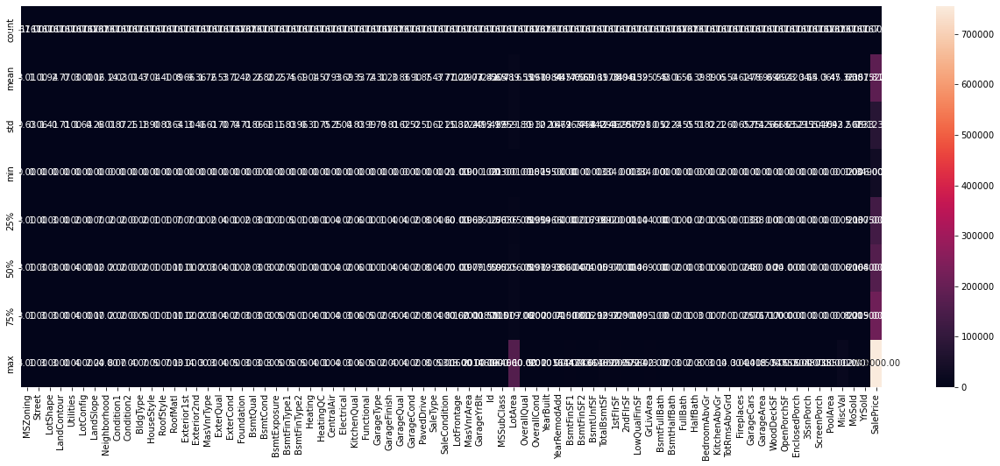

In [87]:
import matplotlib.pyplot as plt
plt.figure(figsize=(22,8))
sns.heatmap(df.describe(),annot=True ,fmt='0.2f')

# Correlation

In [88]:
df.corr()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSZoning,1.000000,0.140216,0.053673,0.001181,NaN,-0.027239,-0.023956,-0.251832,-0.025651,0.031959,...,-0.004524,-0.153024,0.111220,0.004407,0.030789,-0.001665,0.003414,-0.051734,-0.004976,-0.133260
Street,0.140216,1.000000,-0.012883,0.105215,NaN,0.000122,-0.141563,0.001413,0.002191,0.001407,...,-0.033111,0.029602,0.021380,0.007344,0.016040,0.004509,-0.030350,-0.008788,-0.019608,0.044796
LotShape,0.053673,-0.012883,1.000000,0.082248,NaN,0.212313,-0.101538,-0.031711,-0.137040,-0.032981,...,-0.143251,-0.088010,0.078299,-0.016179,-0.058118,-0.022268,-0.049720,-0.052422,0.020729,-0.249217
LandContour,0.001181,0.105215,0.082248,1.000000,NaN,-0.031668,-0.386750,0.037196,0.021594,-0.026145,...,-0.011375,0.034429,-0.061689,-0.032957,0.017069,-0.014215,0.020172,-0.023458,0.009666,0.033028
Utilities,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PoolArea,-0.001665,0.004509,-0.022268,-0.014215,NaN,-0.050989,-0.017392,-0.010321,0.009652,-0.001844,...,0.080336,0.068293,0.057341,-0.009627,0.058105,1.000000,0.029766,-0.038774,-0.066114,0.103256
MiscVal,0.003414,-0.030350,-0.049720,0.020172,NaN,-0.023285,-0.001653,0.005027,-0.012665,0.151203,...,-0.006919,-0.017931,0.021349,-0.010916,0.040467,0.029766,1.000000,-0.008903,-0.008485,-0.013124
MoSold,-0.051734,-0.008788,-0.052422,-0.023458,NaN,0.019951,0.030247,0.023602,0.001751,0.013493,...,0.008208,0.072375,-0.037071,0.020256,0.032723,-0.038774,-0.008903,1.000000,-0.145562,0.071922
YrSold,-0.004976,-0.019608,0.020729,0.009666,NaN,-0.009505,-0.005471,0.026259,-0.004147,-0.030000,...,0.030591,-0.064664,-0.005957,0.014377,0.017173,-0.066114,-0.008485,-0.145562,1.000000,-0.045875


<AxesSubplot:>

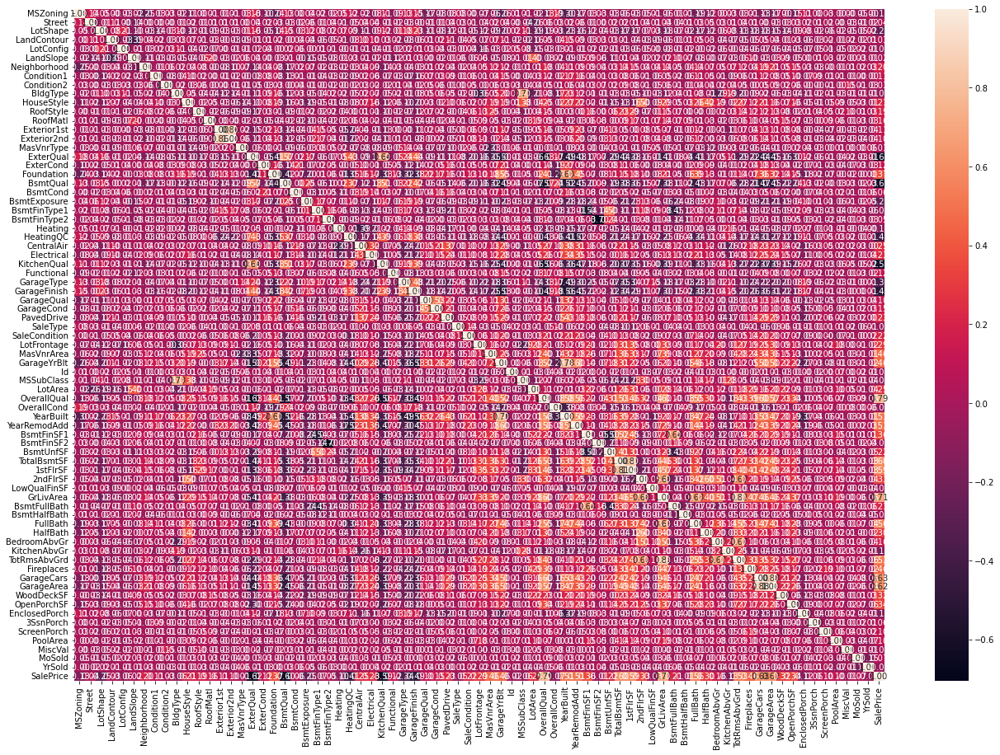

In [92]:
plt.figure(figsize=(22,15))
sns.heatmap(df.corr(), annot=True , fmt='0.2f')

In [91]:
df=df.drop('Utilities',axis=1)

In [93]:
df.corr()['SalePrice']

MSZoning      -0.133260
Street         0.044796
LotShape      -0.249217
LandContour    0.033028
LotConfig     -0.060122
                 ...   
PoolArea       0.103256
MiscVal       -0.013124
MoSold         0.071922
YrSold        -0.045875
SalePrice      1.000000
Name: SalePrice, Length: 75, dtype: float64

<AxesSubplot:>

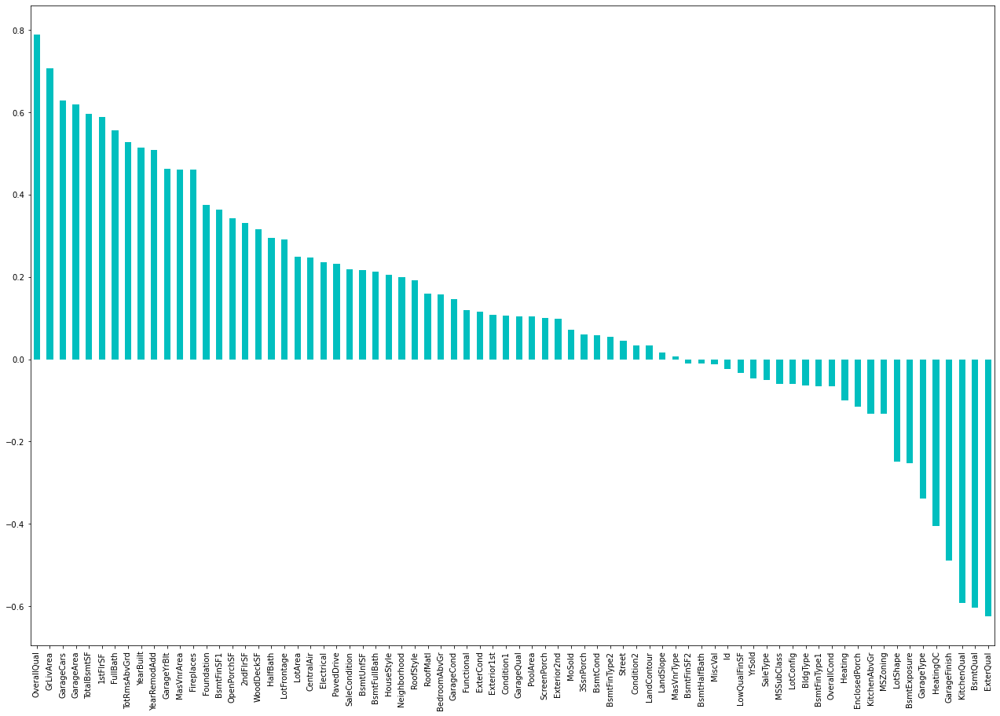

In [94]:
plt.figure(figsize=(22,15))
df.corr()['SalePrice'].sort_values(ascending=False).drop(['SalePrice']).plot(kind='bar', color='c')


we see the correaltion with our output variable.

# skewness

In [95]:
df.skew()

MSZoning       -1.796075
Street        -17.014624
LotShape       -0.606295
LandContour    -3.124262
LotConfig      -1.117503
                 ...    
PoolArea       13.237958
MiscVal        23.056093
MoSold          0.221103
YrSold          0.114402
SalePrice       1.952717
Length: 75, dtype: float64

outliers checking

In [96]:
df.dtypes

MSZoning       int32
Street         int32
LotShape       int32
LandContour    int32
LotConfig      int32
               ...  
PoolArea       int64
MiscVal        int64
MoSold         int64
YrSold         int64
SalePrice      int64
Length: 75, dtype: object

<AxesSubplot:>

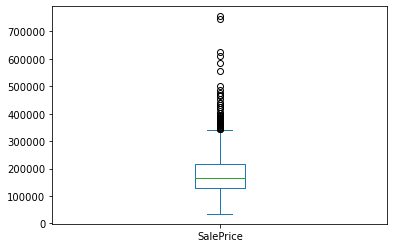

In [97]:
df['SalePrice'].plot.box()

outliers are presents in that column.

MSZoning         AxesSubplot(0.125,0.816017;0.0824468x0.0639831)
Street         AxesSubplot(0.223936,0.816017;0.0824468x0.0639...
LotShape       AxesSubplot(0.322872,0.816017;0.0824468x0.0639...
LandContour    AxesSubplot(0.421809,0.816017;0.0824468x0.0639...
LotConfig      AxesSubplot(0.520745,0.816017;0.0824468x0.0639...
                                     ...                        
PoolArea       AxesSubplot(0.718617,0.20178;0.0824468x0.0639831)
MiscVal        AxesSubplot(0.817553,0.20178;0.0824468x0.0639831)
MoSold              AxesSubplot(0.125,0.125;0.0824468x0.0639831)
YrSold           AxesSubplot(0.223936,0.125;0.0824468x0.0639831)
SalePrice        AxesSubplot(0.322872,0.125;0.0824468x0.0639831)
Length: 75, dtype: object

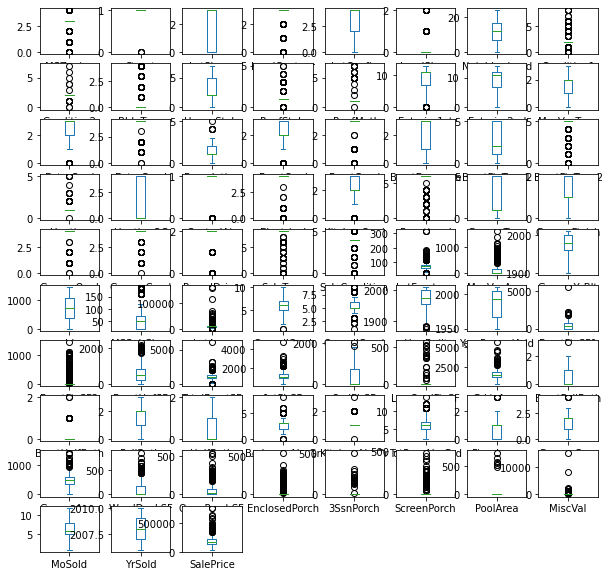

In [100]:
df.plot(kind='box',subplots=True,layout=(10,8),figsize=(10,10))

we see that there are outliers are present in all columns.

<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

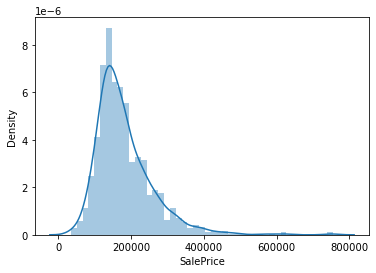

In [101]:
sns.distplot(df['SalePrice'])

array([[<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='

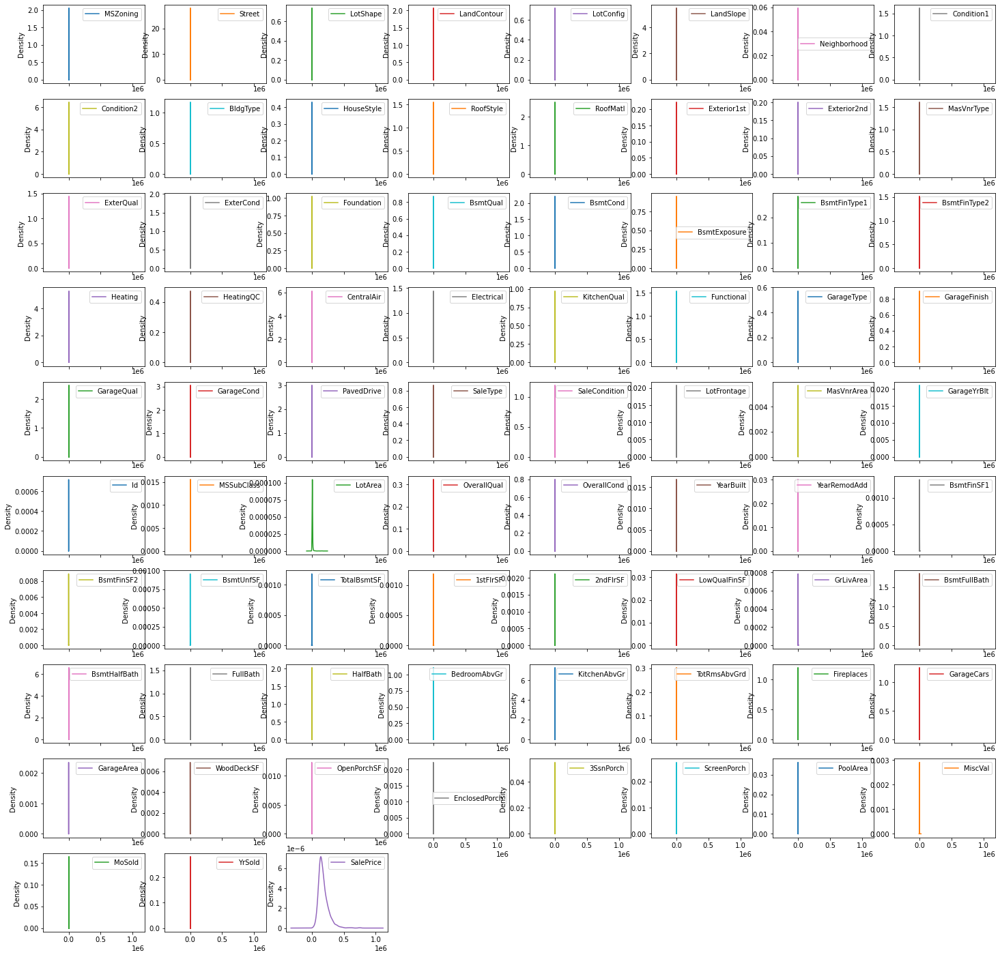

In [104]:
df.plot(kind='kde',subplots=True,layout=(10,8),figsize=(25,25))

we remove the outliers

In [105]:
df.shape

(1167, 75)

In [106]:
from scipy.stats import zscore
import numpy as np
z=np.abs(zscore(df))
threshold=3
np.where(z>3)

(array([   0,    0,    0, ..., 1165, 1165, 1165], dtype=int64),
 array([ 5, 12, 48, ..., 26, 33, 34], dtype=int64))

In [107]:
df

,MSZoning,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
1,3,1,0,3,4,1,12,2,2,0,...,81,207,0,0,224,0,0,10,2007,268000
2,3,1,0,3,1,0,15,2,2,0,...,180,130,0,0,0,0,0,6,2007,269790
3,3,1,0,3,4,0,14,2,2,0,...,0,122,0,0,0,0,0,1,2010,190000
4,3,1,0,3,2,0,14,2,2,0,...,240,0,0,0,0,0,0,6,2009,215000
5,3,1,0,3,4,0,8,2,2,0,...,100,17,0,0,0,0,0,11,2006,219210
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,3,1,0,3,4,0,19,2,2,0,...,0,0,0,0,0,0,0,2,2010,122000
1164,3,1,3,3,4,0,7,1,2,0,...,0,96,0,0,0,0,0,5,2009,108000
1165,3,1,3,3,2,0,13,2,2,3,...,87,0,0,0,0,0,0,7,2009,148500
1166,0,1,3,3,4,0,9,1,2,0,...,0,54,172,0,0,0,0,7,2008,40000


In [108]:
df_new_z=df[(z<3).all(axis=1)]
df_new_z

,MSZoning,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
2,3,1,0,3,1,0,15,2,2,0,...,180,130,0,0,0,0,0,6,2007,269790
5,3,1,0,3,4,0,8,2,2,0,...,100,17,0,0,0,0,0,11,2006,219210
6,3,1,0,3,4,0,19,2,2,0,...,0,0,0,0,95,0,0,5,2010,121500
11,3,1,0,3,1,0,5,2,2,0,...,192,39,0,0,0,0,0,1,2010,237000
12,3,1,0,3,4,0,11,2,2,0,...,100,150,0,0,0,0,0,4,2010,201000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1158,3,1,0,3,4,0,24,2,2,0,...,198,42,0,0,0,0,0,6,2006,165000
1161,3,1,0,3,1,0,8,2,2,0,...,0,0,0,0,0,0,0,5,2009,225000
1163,3,1,0,3,4,0,19,2,2,0,...,0,0,0,0,0,0,0,2,2010,122000
1165,3,1,3,3,2,0,13,2,2,3,...,87,0,0,0,0,0,0,7,2009,148500


seprate the target

In [110]:
features=df.drop("SalePrice", axis=1)
target=df["SalePrice"]

In [114]:
features_test=pd.read_csv('test.csv')

In [115]:
features_test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,83,20,RL,78.0,10206,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal
288,1048,20,RL,57.0,9245,Pave,NaN,IR2,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
289,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal
290,523,50,RM,50.0,5000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2006,WD,Normal


In [116]:
features_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

In [118]:
features_test=features_test.drop(['MiscFeature','Fence','PoolQC','FireplaceQu','Alley'],axis=1)

In [119]:
features_test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,IR1,HLS,AllPub,Corner,...,51,0,0,0,0,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,IR1,Lvl,AllPub,CulDSac,...,0,0,0,0,0,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,Reg,Lvl,AllPub,Inside,...,151,0,0,0,0,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,Reg,Bnk,AllPub,Inside,...,0,0,0,0,0,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,IR1,Lvl,AllPub,CulDSac,...,18,0,0,0,0,0,1,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,83,20,RL,78.0,10206,Pave,Reg,Lvl,AllPub,Inside,...,99,0,0,0,0,0,10,2008,WD,Normal
288,1048,20,RL,57.0,9245,Pave,IR2,Lvl,AllPub,Inside,...,0,0,0,0,0,0,2,2008,WD,Normal
289,17,20,RL,NaN,11241,Pave,IR1,Lvl,AllPub,CulDSac,...,0,0,0,0,0,700,3,2010,WD,Normal
290,523,50,RM,50.0,5000,Pave,Reg,Lvl,AllPub,Corner,...,24,36,0,0,0,0,10,2006,WD,Normal


In [120]:
features_test=features_test.fillna(method='pad')

In [121]:
features_test=features_test.dropna()

In [122]:
features_test.shape

(292, 75)

# preparing the machine learning

In [123]:
from sklearn.preprocessing import MinMaxScaler
mns=MinMaxScaler()
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

In [124]:
# only for the selection the random value
for i in range(0,100):
    features_train,features_test,target_train,target_test=train_test_split(features,target,test_size=0.2,random_state=i)
    lr.fit(features_train , target_train)
    pred_train=lr.predict(features_train)
    pred_test=lr.predict(features_test)
    print(f"at random state {i}, the traing accuracy is- {r2_score(target_train,pred_train)}")
    print(f"at random state {i}, the testing accuracy is-{r2_score(target_test,pred_test)}")
    print('\n')

at random state 0, the traing accuracy is- 0.8238090224559244
at random state 0, the testing accuracy is-0.8545952367712544


at random state 1, the traing accuracy is- 0.8308222093597409
at random state 1, the testing accuracy is-0.8311868459032533


at random state 2, the traing accuracy is- 0.8287763729735347
at random state 2, the testing accuracy is-0.8471994345781123


at random state 3, the traing accuracy is- 0.8481192117779016
at random state 3, the testing accuracy is-0.7484325264672468


at random state 4, the traing accuracy is- 0.8277506387623286
at random state 4, the testing accuracy is-0.837373678091532


at random state 5, the traing accuracy is- 0.8270416413503664
at random state 5, the testing accuracy is-0.8471316858882643


at random state 6, the traing accuracy is- 0.8667707251844502
at random state 6, the testing accuracy is-0.5590232574520898


at random state 7, the traing accuracy is- 0.8398744201694381
at random state 7, the testing accuracy is-0.771776840749

at random state 85, the traing accuracy is- 0.8299125857351934
at random state 85, the testing accuracy is-0.8392314617024615


at random state 86, the traing accuracy is- 0.8521841016572984
at random state 86, the testing accuracy is-0.6811671555271475


at random state 87, the traing accuracy is- 0.8314338826180272
at random state 87, the testing accuracy is-0.8262372604329701


at random state 88, the traing accuracy is- 0.824507571265018
at random state 88, the testing accuracy is-0.8677705541559662


at random state 89, the traing accuracy is- 0.8404656637290022
at random state 89, the testing accuracy is-0.7886629329416208


at random state 90, the traing accuracy is- 0.847757280601273
at random state 90, the testing accuracy is-0.7360910193243495


at random state 91, the traing accuracy is- 0.8986092012831344
at random state 91, the testing accuracy is-0.10411916552229117


at random state 92, the traing accuracy is- 0.826618717082949
at random state 92, the testing accuracy is

In [125]:
features_train,features_test,target_train,target_test=train_test_split(features,target,test_size=0.2,random_state=8)

In [126]:
lr.fit(features_train , target_train)

LinearRegression()

In [127]:
pred_test=lr.predict(features_test)

In [128]:
print(r2_score(target_test,pred_test))

0.8933031398763102


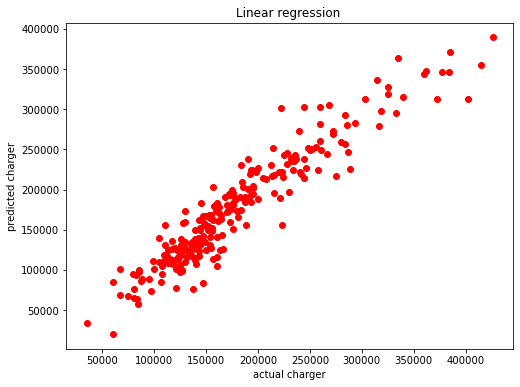

In [129]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8,6))
plt.scatter(x=target_test , y=pred_test, color='r')
plt.xlabel('actual charger')
plt.ylabel('predicted charger')
plt.title('Linear regression ')
plt.show()

# Regularazation

In [130]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

In [131]:
from sklearn.linear_model import Lasso
parameters={'alpha':[.0001, .001, .01,.1,1,10],'random_state':list(range(0,10))}
ls=Lasso()
clf=GridSearchCV(ls,parameters)
clf.fit(features_train, target_train)

print(clf.best_params_)

{'alpha': 10, 'random_state': 0}


In [132]:
ls=Lasso(alpha=10,random_state=0)
ls.fit(features_train,target_train)
ls.score(features_train,target_train)
pred_ls = ls.predict(features_test)

lss=r2_score(target_test, pred_ls)
lss

0.8936064110786817

In [133]:
cv_score=cross_val_score(ls,features,target,cv=5)
cv_mean=cv_score.mean()
cv_mean

0.7436104173500212

# esemble technice

In [135]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

parameters={'criterion':['mse','mae'], 'max_features':['auto','sqrt','log2']}
rf=RandomForestRegressor()
clt=GridSearchCV(rf,parameters)
clt.fit(features_train,target_train)

print(clt.best_params_)

{'criterion': 'mse', 'max_features': 'log2'}


In [136]:
rf=RandomForestRegressor(criterion='mse',max_features='log2')
rf.fit(features_train, target_train)
rf.score(features_train, target_train)
pred_decision=rf.predict(features_test)

rfs=r2_score(target_test,pred_decision)
print('R2 score', rfs*100)

rfscore=cross_val_score(rf,features,target,cv=5)
rfc=rfscore.mean()
print('Cross Val Score', rfc*100)

R2 score 90.28349351436654
Cross Val Score 84.29202362955077


# saving the model

In [140]:
import pickle
filename='housing.pkl'
pickle.dump(rf, open(filename, 'wb'))

# conclusion

In [141]:
import numpy as np
a=np.array(target_test)
predicted=np.array(rf.predict(features_test))
df_com=pd.DataFrame({'original':a, 'predicted':predicted}, index=range(len(a)))
df_com

,original,predicted
0,125500,121059.85
1,115000,119606.90
2,139900,132689.43
3,240000,236203.97
4,98600,135991.30
...,...,...
229,260000,217572.00
230,108000,121233.50
231,372500,327143.49
232,318061,287021.94


we see the original and predicted values and there outputs.